# STEP 2 - Classification of events using the GCMT solutions

This script uses some pre-defined criteria to classify events in 4 distinct classes (3 classes plus an unspecified class) according to their moment tensor. Given that all the inputs are double-couple moment tensors from the earthquake catalog (generated with the STEP 1 script), the classes are the following:

1) Strike-Slip | ID: 1 - strikeslip
2) Normal Faulting | ID: 2 - normal
3) Reverse (Thrust) Faulting | ID: 3 - reverse
4) Unspecified | ID: 4 - unspecified

The python script generates 4 separate files with the GCMT solutions, one for each class.

© Foivos Karakostas - UCL, 2024

------------------------------------------------

#### User inputs

Add a threshold for the error-bar, mimimum can be 0 and maximum 45 degrees. Otherwise the results will be incorrect.

In [23]:
threshold = 45

--------------------------------------------------------

#### Code

Import the necessary packages

In [24]:
import obspy
from obspy.imaging.beachball import mt2axes
from obspy.imaging.beachball import MomentTensor
import numpy as np
from collections import Counter

A function that extracts the dip of the T, N, P axes in order to define the rake and the type of fault.

In [25]:
def classify_fault_type_from_mt(mt, threshold):
    
    MT = MomentTensor(mt[0], mt[1], mt[2], mt[3], mt[4], mt[5], 1)
    T, N, P = mt2axes(MT)
    
    if N.dip > (90 - threshold) and T.dip < threshold and P.dip < threshold: # Strike-slip
        return 1
    elif T.dip > (90 - threshold) and P.dip < threshold: # Normal
        return 2
    elif P.dip > (90 - threshold) and T.dip < threshold: # Reverse
        return 3
    else:
        return 4 # Unclassified

The script that is using the above function and creates 4 separate lists with the respective catalog elements.

In [26]:
classes = []
mtlist = []
longitudes = []
latitudes = []
depths = []
cat = obspy.read_events('Catalogs/CMTSOLUTIONS')
for e in range (0, len(cat)):
    moment_tensor = cat[e].focal_mechanisms[0].moment_tensor;
    longitude = cat[e].origins[0].longitude;
    latitude = cat[e].origins[0].latitude;
    depth = cat[e].origins[0].depth;
    mrr = moment_tensor.tensor.m_rr;
    mtt = moment_tensor.tensor.m_tt;
    mpp = moment_tensor.tensor.m_pp;
    mrt = moment_tensor.tensor.m_rt;
    mrp = moment_tensor.tensor.m_rp;
    mtp = moment_tensor.tensor.m_tp;
    mt = [mrr, mtt, mpp, mrt, mrp, mtp];
    mtlist.append(mt)
    longitudes.append(longitude)
    latitudes.append(latitude)
    depths.append(depth)
    #
    largest_component = max(abs(mrr), abs(mtt), abs(mpp), abs(mrt), abs(mrp), abs(mtp))
    class_id = classify_fault_type_from_mt(mt, threshold)
    classes.append(class_id)
    
class_counts = Counter(classes)
for event_type in range(1, 5):
    count = class_counts.get(event_type, 0)
    print(f"Type {event_type}: {count} occurrences")

Type 1: 27 occurrences
Type 2: 49 occurrences
Type 3: 27 occurrences
Type 4: 9 occurrences


Import necessary packages for maps.

In [27]:
import pygmt
import matplotlib

The part that generates maps for checking the output of the code and the respective catalogs, one for each type.

/var/folders/hx/8nqwb60j4vs0nkjq7c1cm22c0000gn/T/ipykernel_5170/1020974344.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = matplotlib.cm.get_cmap('jet')


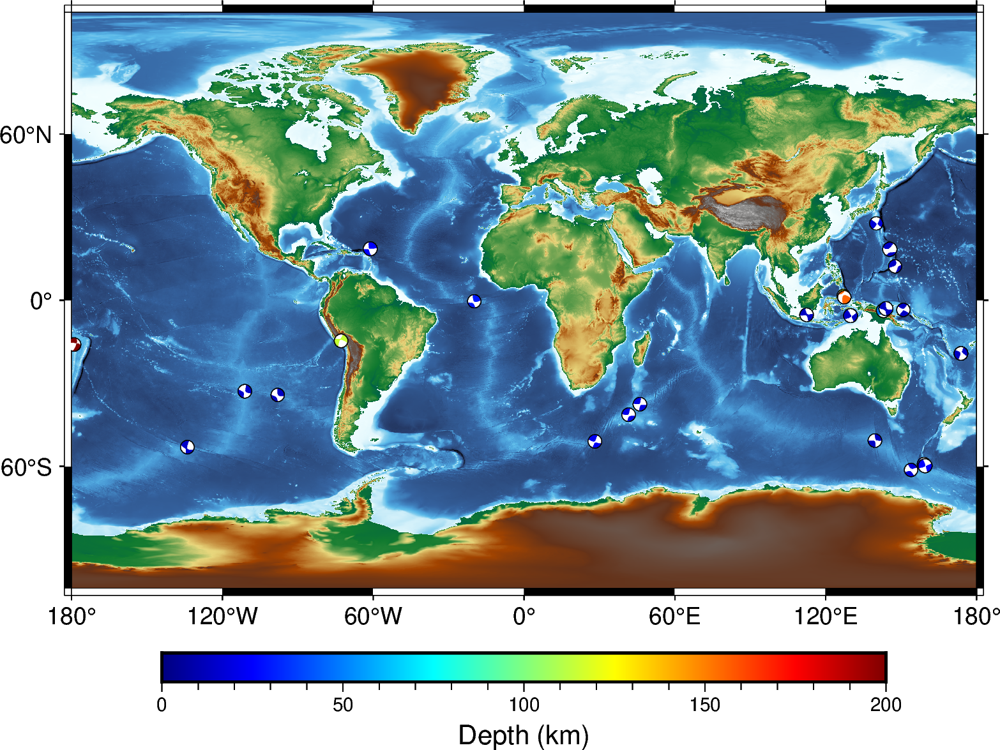

In [28]:
maxlat = 90; minlat = -90; maxlon = 180; minlon = -180
latcen = (maxlat + minlat)/2; loncen = (maxlon + minlon)/2;
grid = pygmt.datasets.load_earth_relief(resolution="05m", region=[minlon, maxlon, minlat, maxlat])

fig1 = pygmt.Figure(); 
pygmt.makecpt(series=[-8000, 8000], cmap='geo')
projection_str = ['Cyl_stere/' + str(loncen) + '/' + str(latcen) + '/12c']
fig1.grdimage(grid=grid, projection=projection_str, frame="a", cmap=True)

cat = obspy.read_events('Catalogs/CMTSOLUTIONS')
cmap2 = matplotlib.cm.get_cmap('jet')

line01 = []; line02 = []; line03 = []; line04 = []; line05 = []; line06 = []; line07 = []; line08 = []; line09 = []
line10 = []; line11 = []; line12 = []; line13 = []; failed = 0; successful = 0

for e in range (0, len(mtlist)):
    type = classes[e]
    if type == 1:
        mt = mtlist[e]
        mrr, mtt, mpp, mrt, mrp, mtp = mt
        latitude = latitudes[e]
        longitude = longitudes[e]
        depth = depths[e]
        rgba = cmap2(depth/200000);
        colorhex = matplotlib.colors.to_hex(rgba, keep_alpha=True)
        focal_mechanism = dict(mrr=mrr, mtt=mtt, mff=mpp, mrt=mrt, mrf=mrp, mtf=mtp, exponent=17);
        fig1.meca(focal_mechanism, scale="0.07c", longitude=longitude, latitude=latitude, depth=depth, compressionfill=colorhex);
        
        #
        
        Mwc = 0
        Mb = 0
        Magnitudes = cat[e].magnitudes
        Magtype = []
        for o in range(0, len(Magnitudes)):
            Magtype.append(Magnitudes[o].magnitude_type)
            if Magtype[o] == 'Mwc':
                Mwc = Magnitudes[o].mag;
            if Magtype[o] == 'Mb':
                Mb = Magnitudes[o].mag;
        eventtime = cat[e].origins[0].time;
        strmicro = str(eventtime.microsecond);
        line01.append(' PDEQ ' + str(eventtime.year).rjust(4) + ' ' + str(eventtime.month).rjust(2) + ' ' + str(eventtime.day).rjust(2) + ' ' + str(eventtime.hour).rjust(2) + ' ' + str(eventtime.minute).rjust(2) + ' ' + str(eventtime.second).rjust(2) + '.' + strmicro[0:2] + ' ' + str("{:-.4f}".format(cat[e].origins[0].latitude)).rjust(8) + ' ' + str("{:-.4f}".format(cat[e].origins[0].longitude)).rjust(8) + ' ' + str(cat[e].origins[1].depth/1000) + '  ' + str("{:-.1f}".format(Mb)).rjust(3) + '  ' + str("{:-.1f}".format(Mwc)).rjust(3) + ' ' + cat[e].event_descriptions[0].text)    
        enam = str(cat[e].origins[0].resource_id)
        line02.append('event name:      ' + enam[50:-10])   
        # Find the time shift
        correctedtime = cat[e].origins[1].time;
        timeshift = correctedtime - eventtime
        line03.append('time shift:      ' + str("{:.4f}".format(timeshift)).rjust(7))
        line04.append('half duration:   ' + str("{:.4f}".format(cat[e].focal_mechanisms[0].moment_tensor.source_time_function.duration/2)).rjust(7))
        line05.append('latitude:       ' + str("{:-.4f}".format(cat[e].origins[1].latitude)).rjust(8))
        line06.append('longitude:      ' + str("{:-.4f}".format(cat[e].origins[1].longitude)).rjust(8))
        line07.append('depth:          ' + str("{:.4f}".format(cat[e].origins[1].depth/1000)).rjust(8))
        line08.append('Mrr:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rr*1e7)).rjust(13))
        line09.append('Mtt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tt*1e7)).rjust(13))
        line10.append('Mpp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_pp*1e7)).rjust(13))
        line11.append('Mrt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rt*1e7)).rjust(13))
        line12.append('Mrp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rp*1e7)).rjust(13))
        line13.append('Mtp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tp*1e7)).rjust(13))
        
catalogfilename = 'Catalogs/CMTSOLUTIONS_Strikeslip_' + str(threshold)
        
with open(catalogfilename, 'w') as f:
    for tt in range(0, len(line01)):
        f.write(line01[tt]); f.write('\n'); f.write(line02[tt]); f.write('\n'); f.write(line03[tt]); f.write('\n')
        f.write(line04[tt]); f.write('\n'); f.write(line05[tt]); f.write('\n'); f.write(line06[tt]); f.write('\n')
        f.write(line07[tt]); f.write('\n'); f.write(line08[tt]); f.write('\n'); f.write(line09[tt]); f.write('\n')
        f.write(line10[tt]); f.write('\n'); f.write(line11[tt]); f.write('\n'); f.write(line12[tt]); f.write('\n')
        f.write(line13[tt]); f.write('\n'); f.write('\n')    

pygmt.makecpt(series=[0, 200], cmap='jet');
fig1.colorbar(frame='af+l"Depth (km)"')
fig1.show()
figfilename1 = 'Figures/Catalog_StrikeSlip_' + str(threshold) + '_map.png'
fig1.savefig(figfilename1)
    

/var/folders/hx/8nqwb60j4vs0nkjq7c1cm22c0000gn/T/ipykernel_5170/175146175.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = matplotlib.cm.get_cmap('jet')


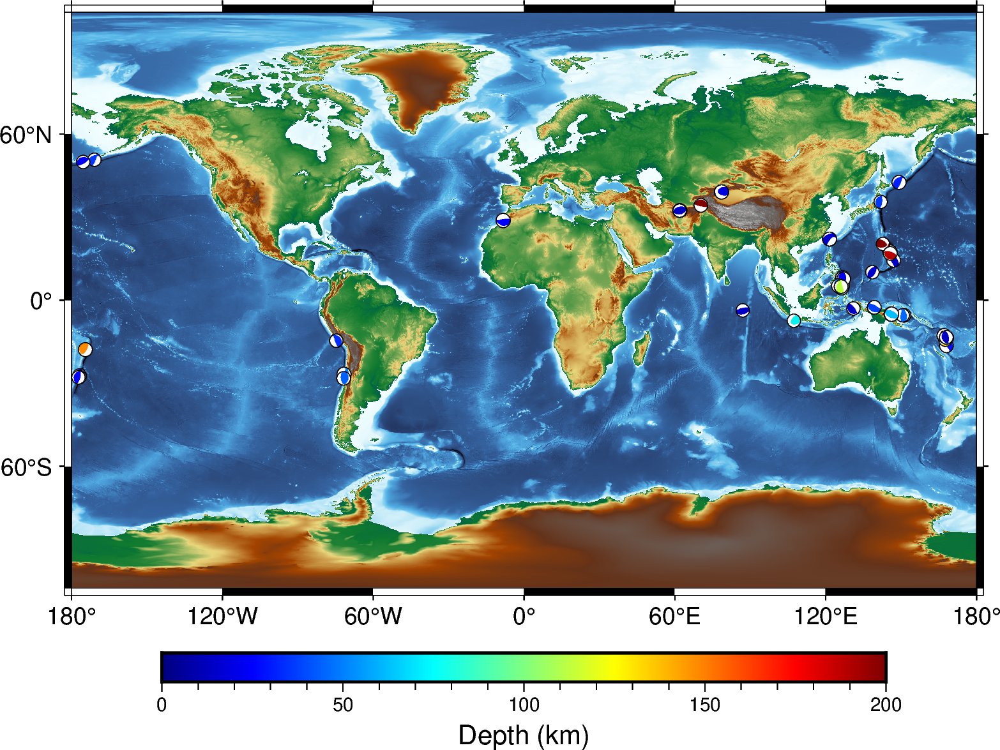

In [29]:
fig2 = pygmt.Figure(); 
pygmt.makecpt(series=[-8000, 8000], cmap='geo')
projection_str = ['Cyl_stere/' + str(loncen) + '/' + str(latcen) + '/12c']
fig2.grdimage(grid=grid, projection=projection_str, frame="a", cmap=True)

cat = obspy.read_events('Catalogs/CMTSOLUTIONS')
cmap2 = matplotlib.cm.get_cmap('jet')

line01 = []; line02 = []; line03 = []; line04 = []; line05 = []; line06 = []; line07 = []; line08 = []; line09 = []
line10 = []; line11 = []; line12 = []; line13 = []; failed = 0; successful = 0

for e in range (0, len(mtlist)):
    type = classes[e]
    if type == 2:
        mt = mtlist[e]
        mrr, mtt, mpp, mrt, mrp, mtp = mt
        latitude = latitudes[e]
        longitude = longitudes[e]
        depth = depths[e]
        rgba = cmap2(depth/200000);
        colorhex = matplotlib.colors.to_hex(rgba, keep_alpha=True)
        focal_mechanism = dict(mrr=mrr, mtt=mtt, mff=mpp, mrt=mrt, mrf=mrp, mtf=mtp, exponent=17);
        fig2.meca(focal_mechanism, scale="0.07c", longitude=longitude, latitude=latitude, depth=depth, compressionfill=colorhex);
                
        #
        
        Mwc = 0
        Mb = 0
        Magnitudes = cat[e].magnitudes
        Magtype = []
        for o in range(0, len(Magnitudes)):
            Magtype.append(Magnitudes[o].magnitude_type)
            if Magtype[o] == 'Mwc':
                Mwc = Magnitudes[o].mag;
            if Magtype[o] == 'Mb':
                Mb = Magnitudes[o].mag;
        eventtime = cat[e].origins[0].time;
        strmicro = str(eventtime.microsecond);
        line01.append(' PDEQ ' + str(eventtime.year).rjust(4) + ' ' + str(eventtime.month).rjust(2) + ' ' + str(eventtime.day).rjust(2) + ' ' + str(eventtime.hour).rjust(2) + ' ' + str(eventtime.minute).rjust(2) + ' ' + str(eventtime.second).rjust(2) + '.' + strmicro[0:2] + ' ' + str("{:-.4f}".format(cat[e].origins[0].latitude)).rjust(8) + ' ' + str("{:-.4f}".format(cat[e].origins[0].longitude)).rjust(8) + ' ' + str(cat[e].origins[1].depth/1000) + '  ' + str("{:-.1f}".format(Mb)).rjust(3) + '  ' + str("{:-.1f}".format(Mwc)).rjust(3) + ' ' + cat[e].event_descriptions[0].text)    
        enam = str(cat[e].origins[0].resource_id)
        line02.append('event name:      ' + enam[50:-10])   
        # Find the time shift
        correctedtime = cat[e].origins[1].time;
        timeshift = correctedtime - eventtime
        line03.append('time shift:      ' + str("{:.4f}".format(timeshift)).rjust(7))
        line04.append('half duration:   ' + str("{:.4f}".format(cat[e].focal_mechanisms[0].moment_tensor.source_time_function.duration/2)).rjust(7))
        line05.append('latitude:       ' + str("{:-.4f}".format(cat[e].origins[1].latitude)).rjust(8))
        line06.append('longitude:      ' + str("{:-.4f}".format(cat[e].origins[1].longitude)).rjust(8))
        line07.append('depth:          ' + str("{:.4f}".format(cat[e].origins[1].depth/1000)).rjust(8))
        line08.append('Mrr:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rr*1e7)).rjust(13))
        line09.append('Mtt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tt*1e7)).rjust(13))
        line10.append('Mpp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_pp*1e7)).rjust(13))
        line11.append('Mrt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rt*1e7)).rjust(13))
        line12.append('Mrp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rp*1e7)).rjust(13))
        line13.append('Mtp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tp*1e7)).rjust(13))
        
catalogfilename = 'Catalogs/CMTSOLUTIONS_Normal_' + str(threshold)
        
with open(catalogfilename, 'w') as f:
    for tt in range(0, len(line01)):
        f.write(line01[tt]); f.write('\n'); f.write(line02[tt]); f.write('\n'); f.write(line03[tt]); f.write('\n')
        f.write(line04[tt]); f.write('\n'); f.write(line05[tt]); f.write('\n'); f.write(line06[tt]); f.write('\n')
        f.write(line07[tt]); f.write('\n'); f.write(line08[tt]); f.write('\n'); f.write(line09[tt]); f.write('\n')
        f.write(line10[tt]); f.write('\n'); f.write(line11[tt]); f.write('\n'); f.write(line12[tt]); f.write('\n')
        f.write(line13[tt]); f.write('\n'); f.write('\n')   

pygmt.makecpt(series=[0, 200], cmap='jet');
fig2.colorbar(frame='af+l"Depth (km)"')
fig2.show()
figfilename2 = 'Figures/Catalog_Normal_' + str(threshold) + '_map.png'
fig2.savefig(figfilename2)

/var/folders/hx/8nqwb60j4vs0nkjq7c1cm22c0000gn/T/ipykernel_5170/3852320823.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = matplotlib.cm.get_cmap('jet')


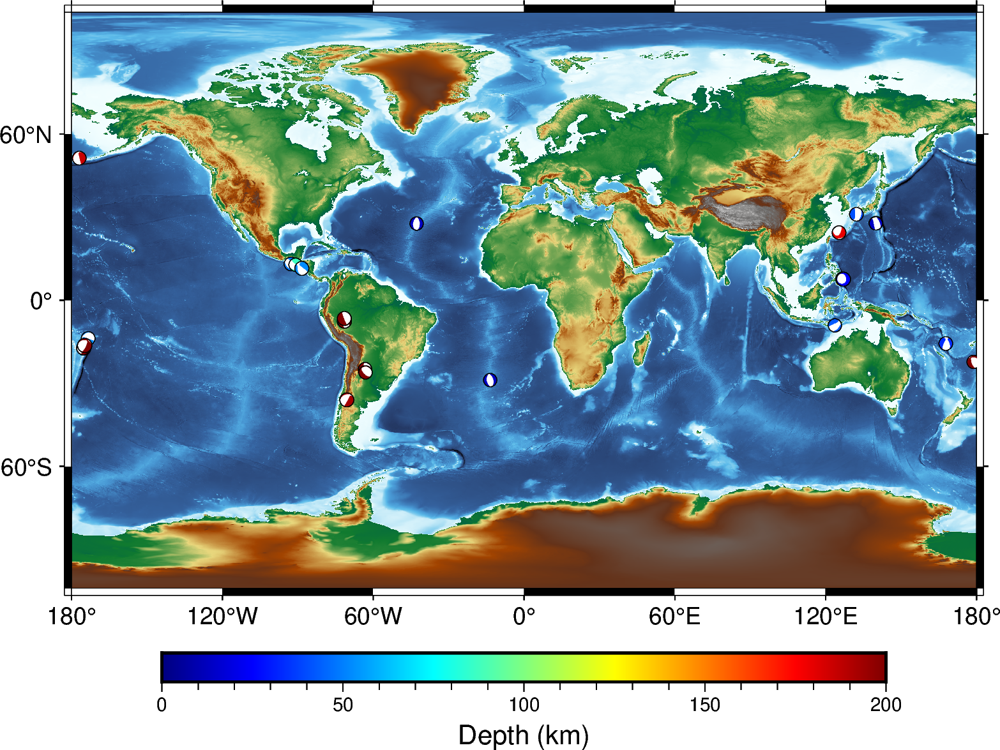

In [30]:
fig3 = pygmt.Figure(); 
pygmt.makecpt(series=[-8000, 8000], cmap='geo')
projection_str = ['Cyl_stere/' + str(loncen) + '/' + str(latcen) + '/12c']
fig3.grdimage(grid=grid, projection=projection_str, frame="a", cmap=True)

cat = obspy.read_events('Catalogs/CMTSOLUTIONS')
cmap2 = matplotlib.cm.get_cmap('jet')

line01 = []; line02 = []; line03 = []; line04 = []; line05 = []; line06 = []; line07 = []; line08 = []; line09 = []
line10 = []; line11 = []; line12 = []; line13 = []; failed = 0; successful = 0

for e in range (0, len(mtlist)):
    type = classes[e]
    if type == 3:
        mt = mtlist[e]
        mrr, mtt, mpp, mrt, mrp, mtp = mt
        latitude = latitudes[e]
        longitude = longitudes[e]
        depth = depths[e]
        rgba = cmap2(depth/200000);
        colorhex = matplotlib.colors.to_hex(rgba, keep_alpha=True)
        focal_mechanism = dict(mrr=mrr, mtt=mtt, mff=mpp, mrt=mrt, mrf=mrp, mtf=mtp, exponent=17);
        fig3.meca(focal_mechanism, scale="0.07c", longitude=longitude, latitude=latitude, depth=depth, compressionfill=colorhex);
                
        #
        
        Mwc = 0
        Mb = 0
        Magnitudes = cat[e].magnitudes
        Magtype = []
        for o in range(0, len(Magnitudes)):
            Magtype.append(Magnitudes[o].magnitude_type)
            if Magtype[o] == 'Mwc':
                Mwc = Magnitudes[o].mag;
            if Magtype[o] == 'Mb':
                Mb = Magnitudes[o].mag;
        eventtime = cat[e].origins[0].time;
        strmicro = str(eventtime.microsecond);
        line01.append(' PDEQ ' + str(eventtime.year).rjust(4) + ' ' + str(eventtime.month).rjust(2) + ' ' + str(eventtime.day).rjust(2) + ' ' + str(eventtime.hour).rjust(2) + ' ' + str(eventtime.minute).rjust(2) + ' ' + str(eventtime.second).rjust(2) + '.' + strmicro[0:2] + ' ' + str("{:-.4f}".format(cat[e].origins[0].latitude)).rjust(8) + ' ' + str("{:-.4f}".format(cat[e].origins[0].longitude)).rjust(8) + ' ' + str(cat[e].origins[1].depth/1000) + '  ' + str("{:-.1f}".format(Mb)).rjust(3) + '  ' + str("{:-.1f}".format(Mwc)).rjust(3) + ' ' + cat[e].event_descriptions[0].text)    
        enam = str(cat[e].origins[0].resource_id)
        line02.append('event name:      ' + enam[50:-10])   
        # Find the time shift
        correctedtime = cat[e].origins[1].time;
        timeshift = correctedtime - eventtime
        line03.append('time shift:      ' + str("{:.4f}".format(timeshift)).rjust(7))
        line04.append('half duration:   ' + str("{:.4f}".format(cat[e].focal_mechanisms[0].moment_tensor.source_time_function.duration/2)).rjust(7))
        line05.append('latitude:       ' + str("{:-.4f}".format(cat[e].origins[1].latitude)).rjust(8))
        line06.append('longitude:      ' + str("{:-.4f}".format(cat[e].origins[1].longitude)).rjust(8))
        line07.append('depth:          ' + str("{:.4f}".format(cat[e].origins[1].depth/1000)).rjust(8))
        line08.append('Mrr:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rr*1e7)).rjust(13))
        line09.append('Mtt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tt*1e7)).rjust(13))
        line10.append('Mpp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_pp*1e7)).rjust(13))
        line11.append('Mrt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rt*1e7)).rjust(13))
        line12.append('Mrp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rp*1e7)).rjust(13))
        line13.append('Mtp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tp*1e7)).rjust(13))
        
catalogfilename = 'Catalogs/CMTSOLUTIONS_Reverse_' + str(threshold)
        
with open(catalogfilename, 'w') as f:
    for tt in range(0, len(line01)):
        f.write(line01[tt]); f.write('\n'); f.write(line02[tt]); f.write('\n'); f.write(line03[tt]); f.write('\n')
        f.write(line04[tt]); f.write('\n'); f.write(line05[tt]); f.write('\n'); f.write(line06[tt]); f.write('\n')
        f.write(line07[tt]); f.write('\n'); f.write(line08[tt]); f.write('\n'); f.write(line09[tt]); f.write('\n')
        f.write(line10[tt]); f.write('\n'); f.write(line11[tt]); f.write('\n'); f.write(line12[tt]); f.write('\n')
        f.write(line13[tt]); f.write('\n'); f.write('\n')   

pygmt.makecpt(series=[0, 200], cmap='jet');
fig3.colorbar(frame='af+l"Depth (km)"')
fig3.show()
figfilename3 = 'Figures/Catalog_Reverse_' + str(threshold) + '_map.png'
fig3.savefig(figfilename3)

/var/folders/hx/8nqwb60j4vs0nkjq7c1cm22c0000gn/T/ipykernel_5170/751693061.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap2 = matplotlib.cm.get_cmap('jet')


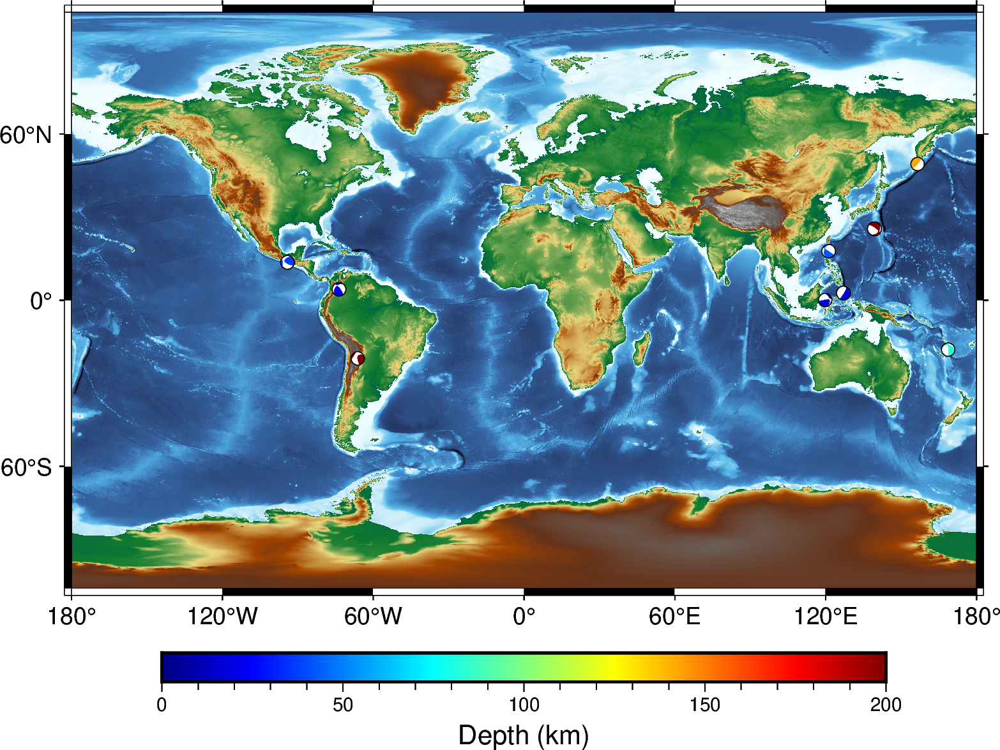

In [31]:
fig4 = pygmt.Figure(); 
pygmt.makecpt(series=[-8000, 8000], cmap='geo')
projection_str = ['Cyl_stere/' + str(loncen) + '/' + str(latcen) + '/12c']
fig4.grdimage(grid=grid, projection=projection_str, frame="a", cmap=True)

cat = obspy.read_events('Catalogs/CMTSOLUTIONS')
cmap2 = matplotlib.cm.get_cmap('jet')

line01 = []; line02 = []; line03 = []; line04 = []; line05 = []; line06 = []; line07 = []; line08 = []; line09 = []
line10 = []; line11 = []; line12 = []; line13 = []; failed = 0; successful = 0

for e in range (0, len(mtlist)):
    type = classes[e]
    if type == 4:
        mt = mtlist[e]
        mrr, mtt, mpp, mrt, mrp, mtp = mt
        latitude = latitudes[e]
        longitude = longitudes[e]
        depth = depths[e]
        rgba = cmap2(depth/200000);
        colorhex = matplotlib.colors.to_hex(rgba, keep_alpha=True)
        focal_mechanism = dict(mrr=mrr, mtt=mtt, mff=mpp, mrt=mrt, mrf=mrp, mtf=mtp, exponent=17);
        fig4.meca(focal_mechanism, scale="0.07c", longitude=longitude, latitude=latitude, depth=depth, compressionfill=colorhex);
                
        #
        
        Mwc = 0
        Mb = 0
        Magnitudes = cat[e].magnitudes
        Magtype = []
        for o in range(0, len(Magnitudes)):
            Magtype.append(Magnitudes[o].magnitude_type)
            if Magtype[o] == 'Mwc':
                Mwc = Magnitudes[o].mag;
            if Magtype[o] == 'Mb':
                Mb = Magnitudes[o].mag;
        eventtime = cat[e].origins[0].time;
        strmicro = str(eventtime.microsecond);
        line01.append(' PDEQ ' + str(eventtime.year).rjust(4) + ' ' + str(eventtime.month).rjust(2) + ' ' + str(eventtime.day).rjust(2) + ' ' + str(eventtime.hour).rjust(2) + ' ' + str(eventtime.minute).rjust(2) + ' ' + str(eventtime.second).rjust(2) + '.' + strmicro[0:2] + ' ' + str("{:-.4f}".format(cat[e].origins[0].latitude)).rjust(8) + ' ' + str("{:-.4f}".format(cat[e].origins[0].longitude)).rjust(8) + ' ' + str(cat[e].origins[1].depth/1000) + '  ' + str("{:-.1f}".format(Mb)).rjust(3) + '  ' + str("{:-.1f}".format(Mwc)).rjust(3) + ' ' + cat[e].event_descriptions[0].text)    
        enam = str(cat[e].origins[0].resource_id)
        line02.append('event name:      ' + enam[50:-10])   
        # Find the time shift
        correctedtime = cat[e].origins[1].time;
        timeshift = correctedtime - eventtime
        line03.append('time shift:      ' + str("{:.4f}".format(timeshift)).rjust(7))
        line04.append('half duration:   ' + str("{:.4f}".format(cat[e].focal_mechanisms[0].moment_tensor.source_time_function.duration/2)).rjust(7))
        line05.append('latitude:       ' + str("{:-.4f}".format(cat[e].origins[1].latitude)).rjust(8))
        line06.append('longitude:      ' + str("{:-.4f}".format(cat[e].origins[1].longitude)).rjust(8))
        line07.append('depth:          ' + str("{:.4f}".format(cat[e].origins[1].depth/1000)).rjust(8))
        line08.append('Mrr:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rr*1e7)).rjust(13))
        line09.append('Mtt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tt*1e7)).rjust(13))
        line10.append('Mpp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_pp*1e7)).rjust(13))
        line11.append('Mrt:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rt*1e7)).rjust(13))
        line12.append('Mrp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_rp*1e7)).rjust(13))
        line13.append('Mtp:       ' + str("{:-.6e}".format(cat[e].focal_mechanisms[0].moment_tensor.tensor.m_tp*1e7)).rjust(13))
        
catalogfilename = 'Catalogs/CMTSOLUTIONS_Unclassified_' + str(threshold)
        
with open(catalogfilename, 'w') as f:
    for tt in range(0, len(line01)):
        f.write(line01[tt]); f.write('\n'); f.write(line02[tt]); f.write('\n'); f.write(line03[tt]); f.write('\n')
        f.write(line04[tt]); f.write('\n'); f.write(line05[tt]); f.write('\n'); f.write(line06[tt]); f.write('\n')
        f.write(line07[tt]); f.write('\n'); f.write(line08[tt]); f.write('\n'); f.write(line09[tt]); f.write('\n')
        f.write(line10[tt]); f.write('\n'); f.write(line11[tt]); f.write('\n'); f.write(line12[tt]); f.write('\n')
        f.write(line13[tt]); f.write('\n'); f.write('\n')   

pygmt.makecpt(series=[0, 200], cmap='jet');
fig4.colorbar(frame='af+l"Depth (km)"')
fig4.show()
figfilename4 = 'Figures/Catalog_Unclassified_' + str(threshold) + '_map.png'
fig4.savefig(figfilename4)